# Augmentations-3: Results / Tests on Data

In [2]:
import os
import time
from pathlib import Path

root = Path.cwd()
print(root)
if root.name == "ipynb":
    root = root.parent
    os.chdir(root)
print(root)

import zarr
import tifffile
import numpy as np
import pandas as pd
from tqdm import tqdm
import matplotlib.pyplot as plt
import ipywidgets as widgets
from scipy.ndimage import rotate

np.random.seed(42)

# Assuming all test splits
NO_AUG_DIR = root / f"fisbe/biapy-no-aug/test/raw"
CHANNEL_ROT_DIR = root / f"fisbe/biapy-channel-rot/train/raw"
CHANNEL_COLOR_DIR = root / f"fisbe/biapy-channel-color/train/raw"
ORIGINAL_DIR = Path("fisbe/completely/test")
ORIGINAL_MIP_DIR = Path("fisbe/mips/completely/test")


/scratch/wmz2007/neuroinfo_fruitfly/ipynb
/scratch/wmz2007/neuroinfo_fruitfly


## Helper Functions

### Imaging

In [3]:
def gen_mip(raw, axis) -> np.ndarray:
    """Max-intensity projection of RGB channels. For CZYX: axis=1 is the z projection."""
    mip = raw.astype(np.float32).max(axis=axis)
    mip = (mip - mip.min()) / (np.ptp(mip) + 1e-8)
    return np.moveaxis(mip, 0, -1)  # (Y, X, C)

In [4]:
PCT_LOW, PCT_HIGH, GAMMA = 1.0, 99.5, 0.72
def enhance_display(data: np.ndarray) -> np.ndarray:
    """Shared contrast + gamma; same defaults as web/server/services/volume_pipeline.py."""
    v = data.astype(np.float32)
    if not np.any(v > 0):
        return np.zeros_like(v)
    sample = v[v > 0] if np.count_nonzero(v) > 256 else v.ravel()
    lo, hi = np.percentile(sample, [PCT_LOW, PCT_HIGH])
    if hi <= lo:
        lo, hi = float(v.min()), float(v.max())
    if hi <= lo:
        return np.zeros_like(v)
    return np.clip((v - lo) / (hi - lo), 0, 1) ** GAMMA

def fisbe_rgb_mip(raw_czyx, z_axis=1) -> np.ndarray:
    """raw: CZYX. Returns Y×X×3 uint8, web-matched vibrance."""
    c = min(raw_czyx.shape[0], 3)
    mip_cyx = np.asarray(raw_czyx[:c], dtype=np.float32).max(axis=z_axis)  # C,Y,X
    rgb01 = enhance_display(mip_cyx)  # shared stretch across channels (keeps hue)
    return np.moveaxis((rgb01 * 255).astype(np.uint8), 0, -1)

In [5]:
def plot_image_grid(paths, plot_fn, ncols=4, figsize_cell=(2, 2), dpi=100, **plot_kwargs):
    """Load images from `paths` and draw each with `plot_fn` in a grid of `ncols` columns.

    `plot_fn` signature: plot_fn(ax, data, sample_name, **plot_kwargs)
    """
    paths = [Path(p) for p in paths]
    n = len(paths)
    nrows = max(1, int(np.ceil(n / ncols)))
    fig, axes = plt.subplots(
        nrows,
        ncols,
        figsize=(figsize_cell[0] * ncols, figsize_cell[1] * nrows),
        dpi=dpi,
        squeeze=False,
    )
    axes_flat = axes.ravel()
    for i, path in enumerate(paths):
        data = tifffile.imread(path, mode="r")
        plot_fn(axes_flat[i], data, path.stem, **plot_kwargs)
    for j in range(n, len(axes_flat)):
        axes_flat[j].axis("off")
    plt.tight_layout()
    plt.show()
    return fig, axes


In [6]:
def mip_fisbe_gt_instance(ax, labels, sample_name, z_axis=1, font_siz=6):
    """Plot FISBe instance MIP onto `ax`. Callable as plot_fn for plot_image_grid."""
    arr = np.asarray(labels)
    mip = arr.max(axis=z_axis)       # (C, Y, X)
    lab2d = mip.max(axis=0)          # (Y, X)

    rgb = np.zeros((*lab2d.shape, 3), dtype=np.float32)
    for lab in np.unique(lab2d):
        if lab == 0:
            continue
        color = np.random.randint(72, 255, 3).astype(np.float32)
        rgb[lab2d == lab] = color
    rgb /= 255.0

    ax.imshow(rgb)
    ax.set_title(f"GT instance MIP {sample_name}", wrap=True)
    ax.title.set_fontsize(font_siz)
    ax.axis("off")


In [7]:
def mip_biapy_gt_instance(ax, labels, sample_name, z_axis=0, font_siz=6):
    """Plot BiaPy instance MIP onto `ax`. Callable as plot_fn for plot_image_grid."""
    arr = np.asarray(labels)
    mip = arr.max(axis=z_axis)       # (Y, X)

    rgb = np.zeros((*mip.shape, 3), dtype=np.float32)
    for lab in np.unique(mip):
        if lab == 0:
            continue
        color = np.random.randint(72, 255, 3).astype(np.float32)
        rgb[mip == lab] = color
    rgb /= 255.0

    ax.imshow(rgb)
    
    ax.set_title(f"GT instance MIP {sample_name}", wrap=True)
    ax.title.set_fontsize(font_siz)
    ax.axis("off")


In [8]:
def resolve_per_image_paths(config_stem, run="0", sub_folder="per_image", n_samples=None):
    """List TIFFs under metrics/biapy/{stem}/results/{stem}_{run}/{sub_folder}."""
    result_path = Path(f"metrics/biapy/{config_stem}/results/{config_stem}_{run}/{sub_folder}")
    paths = sorted(result_path.glob("*.tif"))
    if not paths:
        raise FileNotFoundError(f"No .tif files in {result_path}")
    if n_samples is not None:
        paths = paths[: max(0, int(n_samples))]
        if not paths:
            raise ValueError("n_samples resolved to an empty path list")
    return paths


def resolve_prediction_channels(n_p_all, p=None, channel_names=None):
    """Normalize `p` to indices and build column labels. Returns (p_idx, labels)."""
    if p is None:
        p_idx = list(range(n_p_all))
    else:
        p_idx = [int(p)] if isinstance(p, (int, np.integer)) else [int(x) for x in p]
        bad = [j for j in p_idx if j < 0 or j >= n_p_all]
        if bad:
            raise ValueError(f"p out of range for P={n_p_all}: {bad}")

    if channel_names is None:
        labels = [f"p{j}" for j in p_idx]
    elif len(channel_names) == n_p_all:
        labels = [channel_names[j] for j in p_idx]
    elif len(channel_names) == len(p_idx):
        labels = list(channel_names)
    else:
        raise ValueError(
            f"channel_names length {len(channel_names)} must be P={n_p_all} or len(p)={len(p_idx)}"
        )
    return p_idx, labels


def prediction_channel_mip(vol_zpyx, channel, threshold=None):
    """Max-project one prediction channel of (Z, P, Y, X) → (Y, X); optional Fiji-style cutoff."""
    mip = np.asarray(vol_zpyx[:, channel]).max(axis=0)
    if threshold is not None:
        # Zero below threshold (keeps supra-threshold intensities for continuous display).
        mip = np.where(mip >= threshold, mip, 0)
    return mip


def auto_prediction_cmap(mip, cmap=None):
    """Binary (≤2 unique values) → gray; continuous → viridis. `cmap` overrides."""
    if cmap is not None:
        return cmap
    return "gray" if np.unique(mip).size <= 2 else "viridis"


def draw_prediction_subplot(ax, mip, *, title=None, ylabel=None, font_siz=6, cmap="viridis"):
    """imshow display-enhanced MIP on `ax` with optional title/ylabel."""
    ax.imshow(enhance_display(mip), cmap=cmap)
    if title is not None:
        ax.set_title(title, fontsize=font_siz)
    if ylabel is not None:
        ax.set_ylabel(ylabel, fontsize=font_siz)
    ax.set_xticks([])
    ax.set_yticks([])


def plot_per_image_predictions(
    config_stem: str,
    run: str = "0",
    *,
    sub_folder: str = "per_image",
    n_samples=None,
    p=None,
    threshold=None,
    figsize_cell=(3, 3),
    dpi=100,
    channel_names=None,
    font_siz=6,
    cmap=None,
):
    """Plot prediction-channel MIPs for TIFFs in a BiaPy result folder.

    Reads ``metrics/biapy/{config_stem}/results/{config_stem}_{run}/{sub_folder}``.
    Each image is ``(Z, P, Y, X)``; the figure has one row per sample and one column
    per selected prediction channel (max-intensity projection over Z).

    Colormap is chosen per subplot: ``gray`` when the MIP has ≤2 unique values,
    else ``viridis``. Pass ``cmap`` to override for all subplots.

    Parameters
    ----------
    n_samples : int or None
        If set, only load/plot the first ``n_samples`` TIFFs (faster).
    p : int, sequence of int, or None
        Prediction channel index/indices to show. ``None`` = all channels.
    threshold : float or None
        If set, values below ``threshold`` on the MIP are zeroed (Fiji-style cutoff).
    """
    # BiaPy per_image TIFFs are (Z, P, Y, X): Z depth, P prediction channels, then Y/X.
    paths = resolve_per_image_paths(config_stem, run, sub_folder, n_samples)

    # Peek P from the first volume only (memmap) so we can validate `p` before the loop.
    first = tifffile.imread(paths[0], mode="r")
    if first.ndim != 4:
        raise ValueError(f"Expected (Z, P, Y, X), got shape {first.shape} for {paths[0].name}")
    n_p_all = int(first.shape[1])
    del first

    p_idx, labels = resolve_prediction_channels(n_p_all, p, channel_names)
    n, n_cols = len(paths), len(p_idx)
    fig, axes = plt.subplots(
        n,
        n_cols,
        figsize=(figsize_cell[0] * n_cols, figsize_cell[1] * n),
        dpi=dpi,
        squeeze=False,
    )

    for i, path in enumerate(paths):
        # Memmap + project only selected channels so we do not materialize full volumes.
        data = tifffile.imread(path, mode="r")  # (Z, P, Y, X)
        for col, j in enumerate(p_idx):
            mip = prediction_channel_mip(data, j, threshold=threshold)
            draw_prediction_subplot(
                axes[i, col],
                mip,
                title=labels[col] if i == 0 else None,
                ylabel=path.stem if col == 0 else None,
                font_siz=font_siz,
                cmap=auto_prediction_cmap(mip, cmap),
            )
        del data

    thresh_txt = f", thr≥{threshold}" if threshold is not None else ""
    fig.suptitle(f"{config_stem}_{run} / {sub_folder}{thresh_txt}", fontsize=font_siz + 2)
    plt.tight_layout()
    plt.show()
    return fig, axes


In [17]:
def resolve_gt_channel_paths(gt_path, n_samples=None):
    """List TIFFs under a BiaPy instance-channel GT folder (label_F.…_Dn.…)."""
    result_path = Path(gt_path)
    paths = sorted(result_path.glob("*.tif"))
    if not paths:
        raise FileNotFoundError(f"No .tif files in {result_path}")
    if n_samples is not None:
        paths = paths[: max(0, int(n_samples))]
        if not paths:
            raise ValueError("n_samples resolved to an empty path list")
    return paths


def plot_gt_instance_channels(
    gt_path,
    *,
    n_samples=None,
    p=None,
    threshold=None,
    figsize_cell=(3, 3),
    dpi=100,
    channel_names=None,
    font_siz=6,
    cmap=None,
):
    """Plot BiaPy instance-channel GT MIPs (F/C/Db/Dn targets the network learns).

    Reads TIFFs from ``gt_path`` (e.g. ``fisbe/.../train/label_F.…_Dn.…``).
    Each image is ``(Z, P, Y, X)`` — same layout as ``per_image`` predictions.
    Reuses the prediction MIP / cmap / draw helpers.

    Parameters
    ----------
    gt_path : str or Path
        Directory of multi-channel GT TIFFs.
    n_samples, p, threshold, channel_names, cmap
        Same meaning as ``plot_per_image_predictions``.
        If ``channel_names`` is None and ``P==4``, defaults to ``['F','C','Db','Dn']``.
    """
    # Same (Z, P, Y, X) stack as predictions; here values are GT targets (F/C binary, Db/Dn continuous).
    paths = resolve_gt_channel_paths(gt_path, n_samples)

    first = tifffile.imread(paths[0], mode="r")
    if first.ndim != 4:
        raise ValueError(f"Expected (Z, P, Y, X), got shape {first.shape} for {paths[0].name}")
    n_p_all = int(first.shape[1])
    del first

    if channel_names is None and n_p_all == 4:
        channel_names = ["F", "C", "Db", "Dn"]

    p_idx, labels = resolve_prediction_channels(n_p_all, p, channel_names)
    n, n_cols = len(paths), len(p_idx)
    fig, axes = plt.subplots(
        n,
        n_cols,
        figsize=(figsize_cell[0] * n_cols, figsize_cell[1] * n),
        dpi=dpi,
        squeeze=False,
    )

    for i, path in enumerate(paths):
        data = tifffile.imread(path, mode="r")  # (Z, P, Y, X)
        for col, j in enumerate(p_idx):
            mip = prediction_channel_mip(data, j, threshold=threshold)
            draw_prediction_subplot(
                axes[i, col],
                mip,
                title=labels[col] if i == 0 else None,
                ylabel=path.stem if col == 0 else None,
                font_siz=font_siz,
                cmap=auto_prediction_cmap(mip, cmap),
            )
        del data

    thresh_txt = f", thr≥{threshold}" if threshold is not None else ""
    fig.suptitle(f"GT channels: {Path(gt_path).name}{thresh_txt}", fontsize=font_siz + 2)
    plt.tight_layout()
    plt.show()
    return fig, axes


### Stats

In [9]:
def per_channel_stats(data: np.ndarray, axis: int = 0) -> pd.DataFrame:
    """Basic stats of values across channels (axis 0 for CZYX).

    Expects shape like (C, Z, Y, X), e.g. (3, 390, 680, 680) uint16.
    """
    data = np.asarray(data)
    n_ch = data.shape[axis]
    rows = []
    for c in range(n_ch):
        ch = np.take(data, c, axis=axis).ravel()
        nonzero = ch[ch > 0]
        rows.append({
            "channel": c,
            "dtype": str(data.dtype),
            "n": ch.size,
            "n_nonzero": int(nonzero.size),
            "min": int(ch.min()) if ch.size else np.nan,
            "max": int(ch.max()) if ch.size else np.nan,
            "mean": float(ch.mean()) if ch.size else np.nan,
            "std": float(ch.std()) if ch.size else np.nan,
            "median": float(np.median(ch)) if ch.size else np.nan,
            "p1": float(np.percentile(ch, 1)) if ch.size else np.nan,
            "p99": float(np.percentile(ch, 99)) if ch.size else np.nan,
            "mean_nonzero": float(nonzero.mean()) if nonzero.size else 0.0,
            "median_nonzero": float(np.median(nonzero)) if nonzero.size else 0.0,
        })
    return pd.DataFrame(rows).set_index("channel")


def per_channel_histogram(
    data: np.ndarray,
    sample_name: str,
    axis: int = 0,
    bins: int = 256,
    range_=None,
    skip_zeros: bool = True,
    log_y: bool = True,
    figsize=(12, 3.5),
):
    """Basic histogram of value distribution across channels (axis 0 for CZYX).

    Plots one subplot per channel. Returns (fig, axes, counts).
    """
    data = np.asarray(data)
    n_ch = data.shape[axis]
    if range_ is None:
        range_ = (int(data.min()), int(data.max()) + 1)

    fig, axes = plt.subplots(1, n_ch, figsize=figsize, sharey=True)
    if n_ch == 1:
        axes = [axes]

    counts = []
    for c, ax in enumerate(axes):
        ch = np.take(data, c, axis=axis).ravel()
        if skip_zeros:
            ch = ch[ch > 0]
        hist, edges = np.histogram(ch, bins=bins, range=range_)
        counts.append(hist)
        centers = (edges[:-1] + edges[1:]) / 2
        ax.bar(centers, hist, width=np.diff(edges), align="center", alpha=0.8)
        ax.set_title(f"channel {c}")
        ax.set_xlabel("value")
        if log_y:
            ax.set_yscale("log")
        ax.set_xlim(range_)

    axes[0].set_ylabel("count" + (" (log)" if log_y else ""))
    fig.suptitle(f"Per-channel value histogram {sample_name}", y=1.02)
    fig.tight_layout()
    return fig, axes, counts


## Viewing Results

In [14]:
CONFIG_STEM = 'biapy-v1-channel-scale'
SUB_FOLDER = 'per_image_post_processing'
RUN = '0'
result_path = Path(f"metrics/biapy/{CONFIG_STEM}/results/{CONFIG_STEM}_{RUN}/{SUB_FOLDER}")
image_paths = list(result_path.glob('*.tif'))
example_sample = tifffile.imread(image_paths[0], mode='r')
print(f"Image sample shape: {example_sample.shape}")
# print(f"Num Unique Values: {len(np.unique(example_sample))}")
def get_metric_paths(sub_folder:str, cf_stem:str, run:str='0'):
    result_path = Path(f"metrics/biapy/{cf_stem}/results/{cf_stem}_{run}/{sub_folder}")
    image_paths = list(result_path.glob('*.tif'))
    return image_paths

def get_gt_paths(full_path:str):
    result_path = Path(full_path)
    image_paths = list(result_path.glob('*.tif'))
    return image_paths


# SUB_FOLDER
# per_image (z, 4, x, y)
# per_image_instances (z, x, y)
# per_image_post_processing (z, x, y)
# train_FCDbDn_instance_channels (z, x, y)

Image sample shape: (390, 680, 680)


### Segmentation Prediction

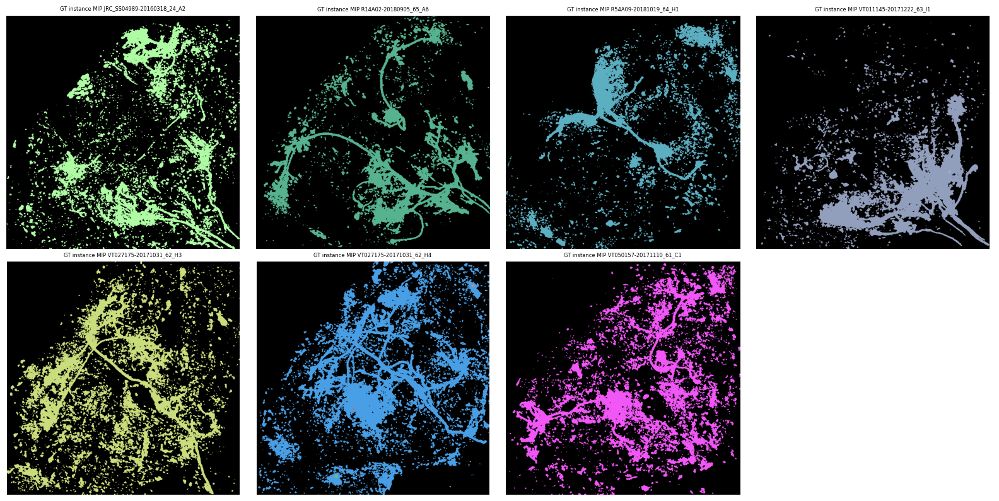

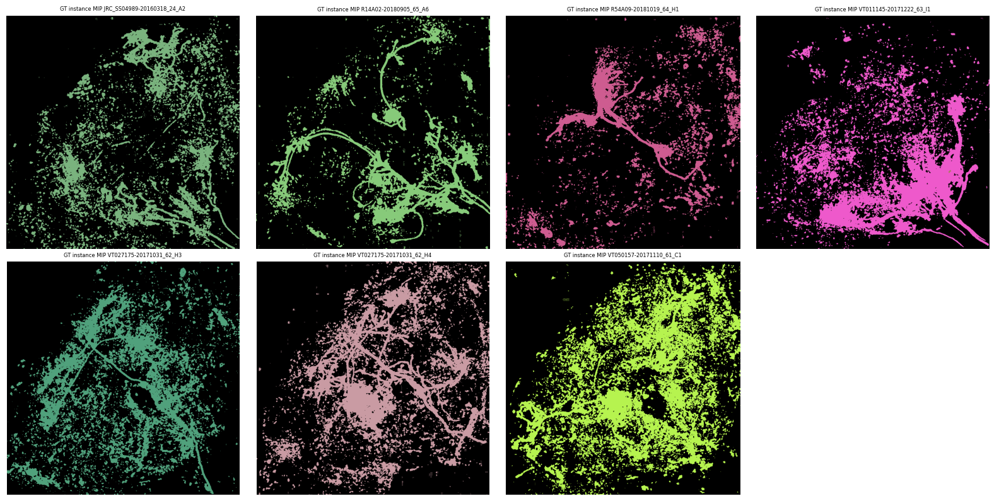

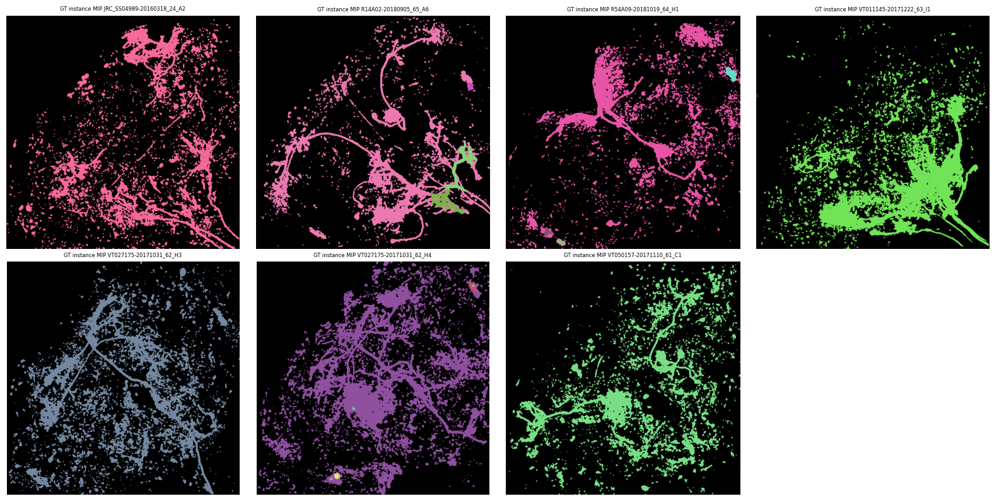

(<Figure size 1600x800 with 8 Axes>,
 array([[<Axes: title={'center': 'GT instance MIP JRC_SS04989-20160318_24_A2'}>,
         <Axes: title={'center': 'GT instance MIP R14A02-20180905_65_A6'}>,
         <Axes: title={'center': 'GT instance MIP R54A09-20181019_64_H1'}>,
         <Axes: title={'center': 'GT instance MIP VT011145-20171222_63_I1'}>],
        [<Axes: title={'center': 'GT instance MIP VT027175-20171031_62_H3'}>,
         <Axes: title={'center': 'GT instance MIP VT027175-20171031_62_H4'}>,
         <Axes: title={'center': 'GT instance MIP VT050157-20171110_61_C1'}>,
         <Axes: >]], dtype=object))

In [ ]:
plot_image_grid(get_metric_paths('per_image_instances', 'biapy-v1-channel-scale'), mip_biapy_gt_instance, ncols=4, figsize_cell=(4, 4), font_siz=6)
plot_image_grid(get_metric_paths('per_image_instances', 'biapy-v1-instance-scale'), mip_biapy_gt_instance, ncols=4, figsize_cell=(4, 4), font_siz=6)
plot_image_grid(get_metric_paths('per_image_instances', 'biapy-v1-no-aug'), mip_biapy_gt_instance, ncols=4, figsize_cell=(4, 4), font_siz=6)


### Ground Truths
See the ground truth lables for different channesl. (e.g. F, C, ...)

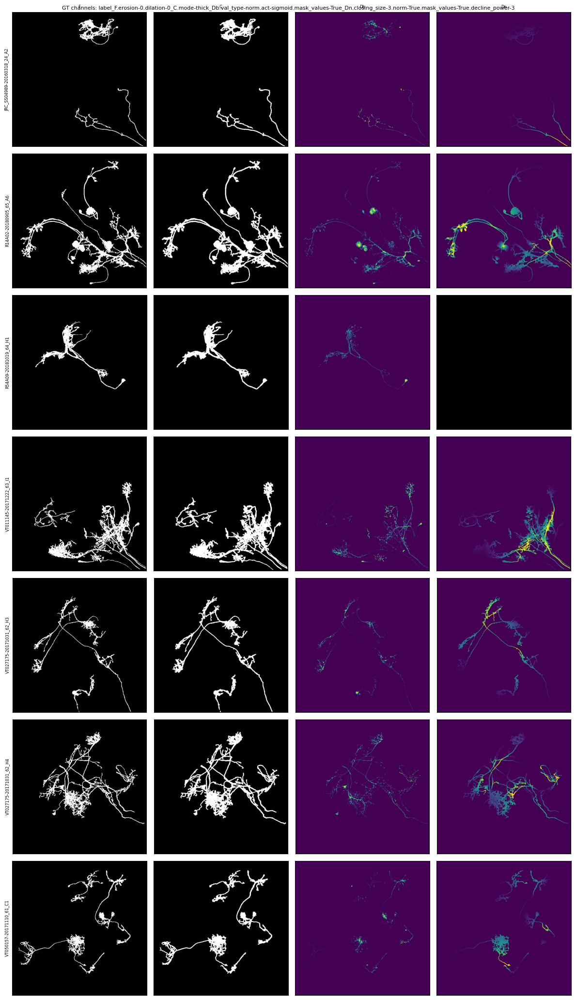

(<Figure size 1200x2100 with 28 Axes>,
 array([[<Axes: title={'center': 'F'}, ylabel='JRC_SS04989-20160318_24_A2'>,
         <Axes: title={'center': 'C'}>, <Axes: title={'center': 'Db'}>,
         <Axes: title={'center': 'Dn'}>],
        [<Axes: ylabel='R14A02-20180905_65_A6'>, <Axes: >, <Axes: >,
         <Axes: >],
        [<Axes: ylabel='R54A09-20181019_64_H1'>, <Axes: >, <Axes: >,
         <Axes: >],
        [<Axes: ylabel='VT011145-20171222_63_I1'>, <Axes: >, <Axes: >,
         <Axes: >],
        [<Axes: ylabel='VT027175-20171031_62_H3'>, <Axes: >, <Axes: >,
         <Axes: >],
        [<Axes: ylabel='VT027175-20171031_62_H4'>, <Axes: >, <Axes: >,
         <Axes: >],
        [<Axes: ylabel='VT050157-20171110_61_C1'>, <Axes: >, <Axes: >,
         <Axes: >]], dtype=object))

In [20]:
gt_path = "fisbe/biapy-no-aug/test/label_F.erosion-0.dilation-0_C.mode-thick_Db.val_type-norm.act-sigmoid.mask_values-True_Dn.closing_size-3.norm-True.mask_values-True.decline_power-3"
get_gt_paths(gt_path)
plot_gt_instance_channels(gt_path, n_samples=9)


### Raw Channel Predictions
Hopefully helps with deciding which channesl, seed channels, growth channels, thresholds to choose

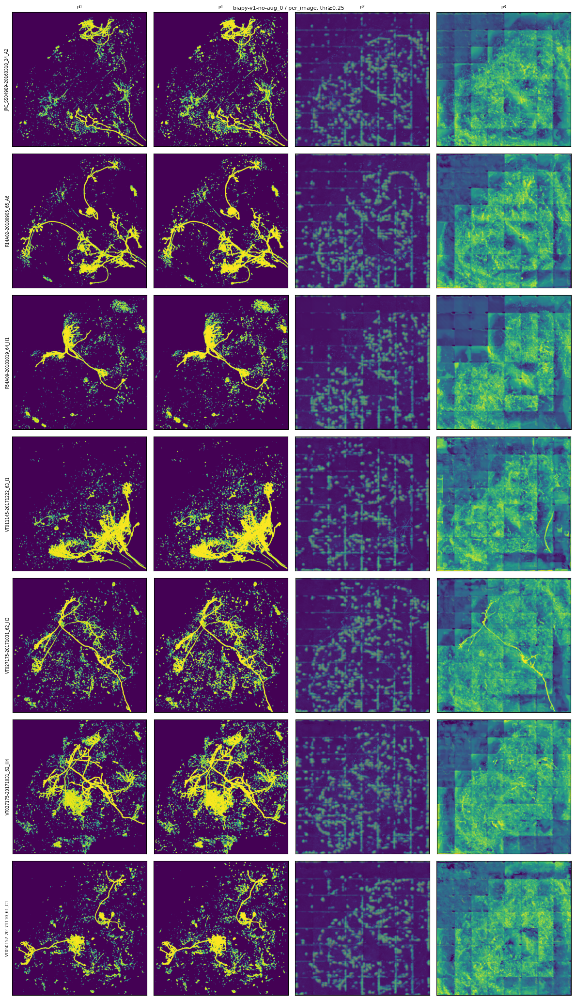

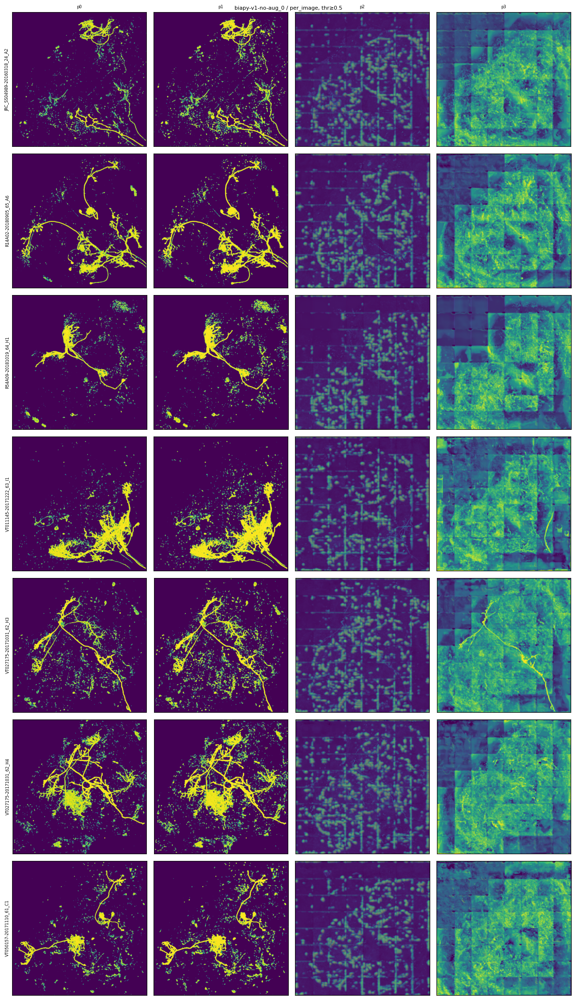

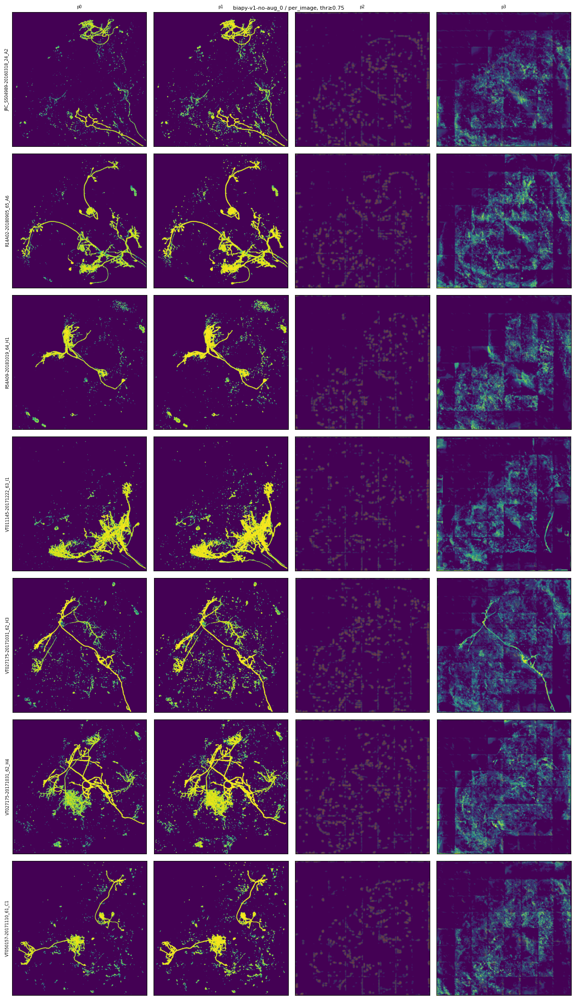

(<Figure size 1200x2100 with 28 Axes>,
 array([[<Axes: title={'center': 'p0'}, ylabel='JRC_SS04989-20160318_24_A2'>,
         <Axes: title={'center': 'p1'}>, <Axes: title={'center': 'p2'}>,
         <Axes: title={'center': 'p3'}>],
        [<Axes: ylabel='R14A02-20180905_65_A6'>, <Axes: >, <Axes: >,
         <Axes: >],
        [<Axes: ylabel='R54A09-20181019_64_H1'>, <Axes: >, <Axes: >,
         <Axes: >],
        [<Axes: ylabel='VT011145-20171222_63_I1'>, <Axes: >, <Axes: >,
         <Axes: >],
        [<Axes: ylabel='VT027175-20171031_62_H3'>, <Axes: >, <Axes: >,
         <Axes: >],
        [<Axes: ylabel='VT027175-20171031_62_H4'>, <Axes: >, <Axes: >,
         <Axes: >],
        [<Axes: ylabel='VT050157-20171110_61_C1'>, <Axes: >, <Axes: >,
         <Axes: >]], dtype=object))

In [12]:
plot_per_image_predictions('biapy-v1-no-aug', n_samples=7, threshold=0.25)
plot_per_image_predictions('biapy-v1-no-aug', n_samples=7, threshold=0.5)
plot_per_image_predictions('biapy-v1-no-aug', n_samples=7, threshold=0.75)